# TF-IDF VSM and k-NN BERT Implementations
### Text Descriptors

In [6]:
# all necessary imports are listed below
# TF-IDF VSM
import os
import random
import cv2
import matplotlib.pyplot as plt
import re
import psycopg2
import psycopg2.extras
import unicodedata
import spacy
import wordninja
from pathlib import Path
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from scipy.sparse import hstack
from sklearn.preprocessing import normalize
from collections import Counter
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(torch.__version__)

2.5.1+cu121


In [7]:
dataset_path = Path(r'C:\Users\danie\Desktop\_\Daniela_Curmi\University\Final_Year_Project\Code_Implementation\Website')

Image Path: C:\Users\danie\Desktop\_\Daniela_Curmi\University\Final_Year_Project\Code_Implementation\Website\paintings\AI-Generated Images\styled_2026_05_05__12_23_37.jpg
Genre: Ai-Generated Images 
Artist: Styled 
Painting Name: 2026_05_05__12_23_37 
Year: Unknown


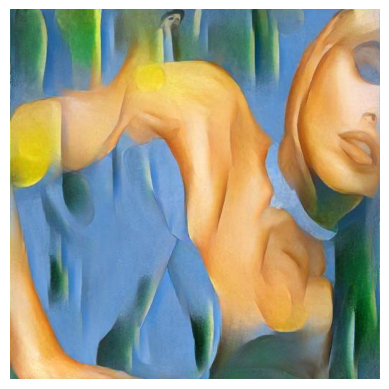

In [8]:
dataset_path_paintings = os.path.join(dataset_path, 'paintings')

# pick a random genre and image 
genre = random.choice(os.listdir(dataset_path_paintings))
rand_genre_path = os.path.join(dataset_path_paintings, genre)
rand_img = random.choice(os.listdir(rand_genre_path))
img_path = os.path.join(rand_genre_path, rand_img)

image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# parse filename for genre, artist, painting, and year 
filename = os.path.splitext(rand_img)[0]  
parts = filename.split("_")                

artist_part = parts[0]
painting_part = "_".join(parts[1:])
match = re.search(r"\b\d{4}\b", painting_part)
if match:
    year = match.group(0)
    painting_part = painting_part.replace(year, "").replace("-", " ")
else:
    year = "Unknown"
    painting_part = painting_part.replace("-", " ")

# clean up outputs and display results
genre = genre.replace("_", " ").title()
artist = artist_part.replace("-", " ").title()
painting_name = painting_part.replace("-", " ").title()

print("Image Path:", img_path)
print(f"Genre: {genre} \nArtist: {artist} \nPainting Name: {painting_name} \nYear: {year}")

plt.imshow(image_rgb)
plt.axis("off")
plt.show()

In [4]:
def text_features(img_path):    
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # parse filename for genre, artist, painting, and year 
    genre = os.path.basename(os.path.dirname(img_path))
    filename = os.path.splitext(os.path.basename(img_path))[0] 
    parts = filename.split("_")                

    artist_part = parts[0]
    painting_part = "_".join(parts[1:])
    match = re.search(r"\b\d{4}\b", painting_part)
    if match:
        year = match.group(0)
        painting_part = painting_part.replace(year, "").replace("-", " ")
    else:
        year = "Unknown"
        painting_part = painting_part.replace("-", " ")

    # clean up outputs and display results
    genre = genre.replace("_", " ").title()
    artist = artist_part.replace("-", " ").title()
    painting_name = painting_part.replace("-", " ").title()

    return image_rgb, genre, artist, genre, painting_name, year

### Database Text Descriptors 

In [9]:
# Database connection
def get_db_connection():
    conn = psycopg2.connect(
        host="localhost",
        database="ART_RECSYS_DB_LOCAL",
        user="postgres",
        password="Catmelon304!"
    )
    return conn

get_db_connection()

<connection object at 0x000001BC3955CE10; dsn: 'user=postgres password=xxx dbname=ART_RECSYS_DB_LOCAL host=localhost', closed: 0>

In this Notebook I will be cover the Implementation of a TF-IDF VSM and k-NN BERT Recommendation Architectures. Sections will comprise of Preprocessing per architecture, Painting Metadata representation, and the final Recommendation Strategy.

## Preprocessing

### Data Validation 

#### Checking for Invalid Data and Cleaning

In [ ]:
# Validation for meta data before cleaning 
def validate_all_paintings():
    conn = get_db_connection()
    cur = conn.cursor(cursor_factory=psycopg2.extras.RealDictCursor)

    # Fetch all paintings with the required fields only
    cur.execute("""
        SELECT
            painting_id,
            year_created,
            birth_year,
            death_year
        FROM paintings_and_artists_metadata_tf_idf
    """)

    rows = cur.fetchall()
    cur.close()
    conn.close()

    validation_results = []

    for row in rows:
        errors = []
        pid = row["painting_id"]

        # Year validation
        year = row["year_created"]
        if year is not None:
            if not (1000 <= year <= 2026):
                errors.append("invalid_year_created")

        # Artist lifespan consistency
        birth = row["birth_year"]
        death = row["death_year"]
        if birth is not None and death is not None:
            if birth > death:
                errors.append("invalid_lifespan")

        # Painting before artist birth
        if year is not None and birth is not None:
            if year < birth:
                errors.append("painting_before_birth")

        if errors:
            validation_results.append({
                "painting_id": pid,
                "title": row["title"],
                "errors": errors
            })

    return validation_results

validation_results = validate_all_paintings()
print(validation_results)

[]


#### Extracting Year from Title, Wrong Year from Title, Wrong Year and Removed

In [ ]:
# Resolve 'invalid_year_created' and 'painting_before_birth'
def extract_year_from_title(title):
    if not title:
        return None

    # Match years between 1000–2026
    matches = re.findall(r"\b(1[0-9]{3}|20[0-2][0-6])\b", title)

    if not matches:
        return None

    return int(matches[-1])

def fix_years_from_titles(paintings_with_errors):
    conn = get_db_connection()
    cur = conn.cursor(cursor_factory=psycopg2.extras.RealDictCursor)

    for item in paintings_with_errors:
        pid = item["painting_id"]
        title = item["title"]

        extracted_year = extract_year_from_title(title)

        if extracted_year:
            print(f"Updating painting {pid}: setting year_created to {extracted_year}")

            cur.execute("""
                UPDATE paintings_and_artists_metadata_tf_idf
                SET year_created = %s
                WHERE painting_id = %s
            """, (extracted_year, pid))
        else:
            print(f"Skipping painting {pid}: no valid year found in title")

    conn.commit()
    cur.close()
    conn.close()

fix_years_from_titles(validation_results)

Updating painting 103: setting year_created to 1985
Updating painting 104: setting year_created to 1991
Updating painting 105: setting year_created to 1984
Updating painting 106: setting year_created to 1984
Updating painting 114: setting year_created to 1960
Updating painting 117: setting year_created to 1962
Skipping painting 924: no valid year found in title
Skipping painting 1319: no valid year found in title
Updating painting 2257: setting year_created to 1985
Updating painting 2431: setting year_created to 1972
Updating painting 2434: setting year_created to 1975
Skipping painting 2530: no valid year found in title
Skipping painting 3234: no valid year found in title
Updating painting 3624: setting year_created to 1912
Updating painting 3844: setting year_created to 1908
Skipping painting 3881: no valid year found in title
Updating painting 3894: setting year_created to 1952
Updating painting 4124: setting year_created to 1896
Updating painting 4256: setting year_created to 1908


In [ ]:
# Resolve 'invalid_year_created' and 'painting_before_birth'
wrong_year_move_to_title  = [{'painting_id': 3234,
  'title': 'Prince Ukhtomsky In The Battle With Tartars At Volga In  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 3881,
  'title': 'The Life Of St Ignatius Loyola Plate 10 The Death Of St Ignatius 31St July  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 5278,
  'title': 'Design For The  Piastres Porto Brand Of Austrian Post In The Levant Not Issued',
  'errors': ['painting_before_birth']},
 {'painting_id': 15055,
  'title': 'Aleksandra Ekster Costume Designs For A  Production Of Salome',
  'errors': ['painting_before_birth']},
 {'painting_id': 18191,
  'title': 'Founding Act Of The Municipal Savings Bank Of Vitoria In  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 18319, 'title': 'P ', 'errors': ['invalid_year_created']},
 {'painting_id': 46503,
  'title': 'Crusaders Arrived In Constantinople Battle Between The French And Turks In  And 1148',
  'errors': ['painting_before_birth']},
 {'painting_id': 46517,
  'title': 'Entry Of Louis Vii C  80 King Of France And Conrad Iii 1093 1152 King Of Germany Into',
  'errors': ['painting_before_birth']},
 {'painting_id': 46563,
  'title': 'The Arrival Of Charles V  80 In Paris 28Th May 1364',
  'errors': ['painting_before_birth']},
 {'painting_id': 39665,
  'title': 'Catherine Of Siena Escorted Pope Gregory Xi At Rome On 17Th January  ',
  'errors': ['painting_before_birth']},
  {'painting_id': 69406,
  'title': 'The Preaching Of John Knox Before The Lords Of Congregation 10 June  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 69872,
  'title': 'First Observation Of The Transit Of Venus By William Crabtree In  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 69901,
  'title': 'The Proclamation Regarding Weights And Measures  Illustration From Hutchinson S Story Of',
  'errors': ['painting_before_birth']},
 {'painting_id': 71490,
  'title': 'Chopin Performing In The Guest Hall Of Anton Radziville In Berlin In  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 73536,
  'title': 'Proclamation Of Kuzma Minin In Nizhny Novgorod In  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 77134,
  'title': 'Parade In The  ',
  'errors': ['painting_before_birth']},
  {'painting_id': 49648,
  'title': 'Unknown  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 60771,
  'title': 'Statesmen No  Caricature Of The Rt Hon Cp Villiers M P',
  'errors': ['painting_before_birth']},
 {'painting_id': 60772,
  'title': 'Statesmen No  ',
  'errors': ['painting_before_birth']},
 {'painting_id': 60773,
  'title': 'Statesmen No  Caricature Of The Rt Hon Hbw Brand M P',
  'errors': ['painting_before_birth']},
 {'painting_id': 60774,
  'title': 'Statesmen No  Caricature Of Mr Roger Eykyn Liberal M P For Windsor',
  'errors': ['painting_before_birth']},
 {'painting_id': 60775,
  'title': 'Statesmen No  Caricature Of Sir Francis Goldsmid M P',
  'errors': ['painting_before_birth']},
 {'painting_id': 66648,
  'title': 'The Battle Of La Hogue Destruction Of The French Fleet May 22  Detail',
  'errors': ['painting_before_birth']},
 {'painting_id': 66649,
  'title': 'The Battle Of La Hogue Destruction Of The French Fleet May 22  ',
  'errors': ['painting_before_birth']}]

def insert_year_into_title(title, year):
    if not title or not year:
        return title

    year_str = str(year)

    # If double space exists then insert year there
    if "  " in title:
        new_title = title.replace("  ", f" {year_str} ", 1)
    
    # If ends with space then append at the end
    elif title.endswith(" "):
        new_title = title + year_str
    
    # fallback
    else:
        new_title = f"{title} {year_str}"

    # Clean extra whitespace
    new_title = re.sub(r"\s+", " ", new_title).strip()

    return new_title

def move_year_to_title(paintings_list):
    conn = get_db_connection()
    cur = conn.cursor(cursor_factory=psycopg2.extras.RealDictCursor)

    for item in paintings_list:
        pid = item["painting_id"]

        # Fetch current title + year
        cur.execute("""
            SELECT title, year_created
            FROM paintings_and_artists_metadata_tf_idf
            WHERE painting_id = %s
        """, (pid,))
        
        row = cur.fetchone()
        if not row:
            print(f"Skipping {pid}: not found")
            continue

        title = row["title"]
        year = row["year_created"]

        if not year:
            print(f"Skipping {pid}: no year to move")
            continue

        new_title = insert_year_into_title(title, year)

        print(f"{pid}: '{title}' → '{new_title}'")

        # Update DB
        cur.execute("""
            UPDATE paintings_and_artists_metadata_tf_idf
            SET title = %s,
                year_created = NULL
            WHERE painting_id = %s
        """, (new_title, pid))

    conn.commit()
    cur.close()
    conn.close()

move_year_to_title(wrong_year_move_to_title)

3234: 'Prince Ukhtomsky In The Battle With Tartars At Volga In ' → 'Prince Ukhtomsky In The Battle With Tartars At Volga In 1469'
3881: 'The Life Of St Ignatius Loyola Plate 10 The Death Of St Ignatius 31St July ' → 'The Life Of St Ignatius Loyola Plate 10 The Death Of St Ignatius 31St July 1556'
5278: 'Design For The  Piastres Porto Brand Of Austrian Post In The Levant Not Issued' → 'Design For The 1102 Piastres Porto Brand Of Austrian Post In The Levant Not Issued'
15055: 'Aleksandra Ekster Costume Designs For A  Production Of Salome' → 'Aleksandra Ekster Costume Designs For A 1917 Production Of Salome'
18191: 'Founding Act Of The Municipal Savings Bank Of Vitoria In ' → 'Founding Act Of The Municipal Savings Bank Of Vitoria In 1850'
18319: 'P ' → 'P 5533'
46503: 'Crusaders Arrived In Constantinople Battle Between The French And Turks In  And 1148' → 'Crusaders Arrived In Constantinople Battle Between The French And Turks In 1148 And 1148'
46517: 'Entry Of Louis Vii C  80 King Of Fra

In [ ]:
# Resolve 'invalid_year_created' and 'painting_before_birth'
def nullify_invalid_years(validation_results):
    conn = get_db_connection()
    cur = conn.cursor()

    for item in validation_results:
        pid = item["painting_id"]

        cur.execute("""
            UPDATE paintings_and_artists_metadata_tf_idf
            SET year_created = NULL
            WHERE painting_id = %s
        """, (pid,))

        print(f"Set year_created = NULL for painting_id {pid}")

    conn.commit()
    cur.close()
    conn.close()

nullify_invalid_years(validation_results)

Set year_created = NULL for painting_id 924
Set year_created = NULL for painting_id 1319
Set year_created = NULL for painting_id 2530
Set year_created = NULL for painting_id 41546
Set year_created = NULL for painting_id 42825
Set year_created = NULL for painting_id 48910
Set year_created = NULL for painting_id 67146


#### Standardise unknown title representations to NULL

In [12]:
# In the title column standardise all noisy 'unknown' variants that add no semantic value to NULL so that 
# all models learn one representation of missing title instead of 'untitled', 'untitle', 'untitled (1)', No Title, Not_Detected_22056 etc...
def set_unknown_title():
    conn = get_db_connection()
    cur = conn.cursor()

    query = """ 
        UPDATE paintings_and_artists_metadata_tf_idf
        SET title = NULL
        WHERE title IS NOT NULL
        AND (
            LOWER(title) ~ '^\s*(untitled|unknown|untitle)\s*([0-9]+|\([0-9]+\))?\s*$'
            OR LOWER(title) ~ '^\s*unknown\s+title\s*([0-9]+|\([0-9]+\))?\s*$'
            OR LOWER(title) ~ '^\s*not\s+detected\s*([0-9]+|\([0-9]+\))?\s*$'
            OR LOWER(title) ~ '^\s*not[_\s]*detected[_\s]*\d*$'
            OR LOWER(title) ~ '^\s*no\s+title\s*(\(?\d+\)?\s*)*$'
            ); 
        """
    
    cur.execute(query)

    conn.commit()
    cur.close()

def remove_bracket_nums():
    conn = get_db_connection()
    cur = conn.cursor()

    query = """ 
            UPDATE paintings_and_artists_metadata_tf_idf
            SET title = REGEXP_REPLACE(title, '\s*\(\s*\d+\s*\)', '', 'g')
            WHERE title IS NOT NULL;
            """
    
    cur.execute(query)

    conn.commit()
    cur.close()

set_unknown_title()    
remove_bracket_nums()

#### Check for Missing Values for all Metadata fields and Handle Nulls

In [8]:
# Checking for NULLs/empty cells
def check_nulls_and_empty_cells():
    conn = get_db_connection()
    cur = conn.cursor()

    query = """
    SELECT
        COUNT(*) AS total_rows,

        COUNT(*) FILTER (WHERE title IS NULL OR TRIM(title) = '') AS title_missing,
        COUNT(*) FILTER (WHERE year_created IS NULL) AS year_created_missing,
        COUNT(*) FILTER (WHERE birth_year IS NULL) AS birth_year_missing,
        COUNT(*) FILTER (WHERE death_year IS NULL) AS death_year_missing,
        COUNT(*) FILTER (WHERE genre IS NULL OR TRIM(genre) = '') AS genre_missing,
        COUNT(*) FILTER (WHERE art_style IS NULL OR TRIM(art_style) = '') AS art_style_missing,
        COUNT(*) FILTER (WHERE nationality IS NULL OR TRIM(nationality) = '') AS nationality_missing,
        COUNT(*) FILTER (WHERE artist IS NULL OR TRIM(artist) = '') AS name_missing,
        COUNT(*) FILTER (WHERE media IS NULL OR TRIM(media) = '') AS media_missing,
        COUNT(*) FILTER (WHERE description_tags IS NULL OR TRIM(description_tags) = '') AS description_tags_missing,
        COUNT(*) FILTER (WHERE fields IS NULL OR TRIM(fields) = '') AS fields_missing,
        COUNT(*) FILTER (WHERE art_movements IS NULL OR TRIM(art_movements) = '') AS art_movements_missing,
        COUNT(*) FILTER (WHERE bio IS NULL OR TRIM(bio) = '') AS bio_missing

    FROM paintings_and_artists_metadata_bert;
    """

    cur.execute(query)
    result = cur.fetchone()

    columns = [desc[0] for desc in cur.description]
    summary = dict(zip(columns, result))

    cur.close()
    conn.close()

    return summary

summary_of_missing_values = check_nulls_and_empty_cells()
print(summary_of_missing_values)

{'total_rows': 81444, 'title_missing': 2031, 'year_created_missing': 33503, 'birth_year_missing': 7033, 'death_year_missing': 9454, 'genre_missing': 29388, 'art_style_missing': 0, 'nationality_missing': 7098, 'name_missing': 0, 'media_missing': 54834, 'description_tags_missing': 33639, 'fields_missing': 8065, 'art_movements_missing': 7098, 'bio_missing': 9708}


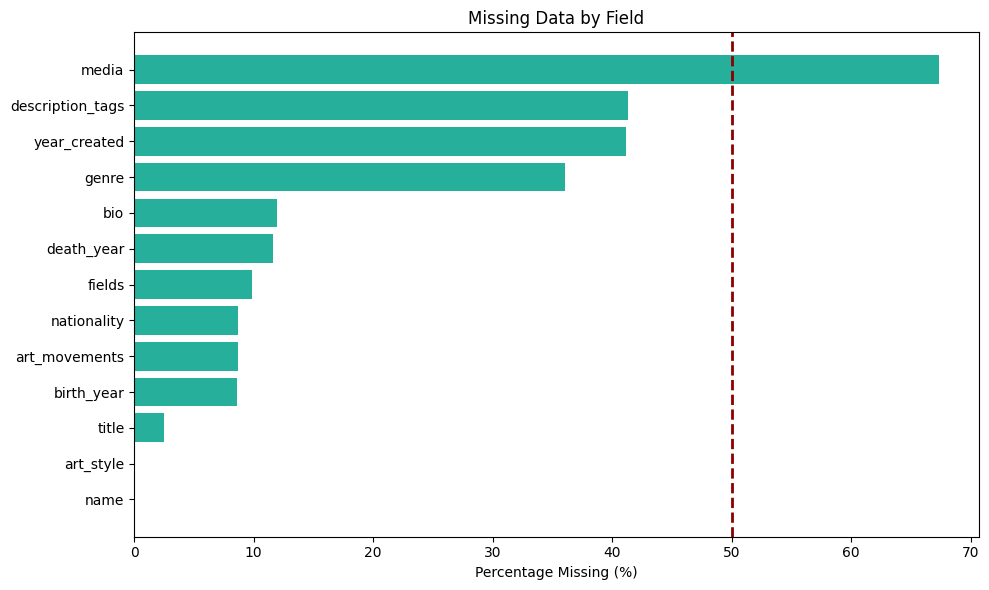

In [6]:
# Plot of missing metadata fields 
def plot_missing_data(summary):
    total = summary['total_rows']
    
    # Remove total_rows, compute percentages, and sort descending
    fields = {k: v for k, v in summary.items() if k != 'total_rows'}
    percentages = {k: (v / total) * 100 for k, v in fields.items()}
    sorted_items = sorted(percentages.items(), key=lambda x: x[1], reverse=True)
    
    labels = [k.replace('_missing', '') for k, _ in sorted_items]
    values = [v for _, v in sorted_items]

    plt.figure(figsize=(10, 6))
    plt.barh(labels, values, color="#26AF9A")
    plt.xlabel("Percentage Missing (%)")
    plt.title("Missing Data by Field")
    plt.gca().invert_yaxis()  

    # Threshold line to indicate fields which have over 50% missing values
    plt.axvline(x=50, linestyle='--', color='darkred', linewidth=2)

    plt.tight_layout()
    plt.show()

plot_missing_data(summary_of_missing_values)

## TF-IDF VEctor Space Model (VSM)

Since TF-IDF ... the following fields where chosen `title, genre, art_style, media, description_tags, artist, and nationality`

Numerical features i.e. all year fields where not handled since they will not be used for TF-IDF, and will be handled in future sections where they are necessary.

### Handling Null and Missing Values

Fields that contain missing values; 

**Painting Details** title, genre, media, description_tags

**Artist Details** nationality

#### Categorical 
**Genre, Nationality**

There are several techniques typically used to handle missing/null values in categorical feilds, these include;

(1) deleting rows with missing values, only used if there are only a few rows and the dataset is large 

(2) replace missing values with the most frequent value i.e. mode

(3) **replace missing values with an empty string i.e. " "**

(4) replace with a constant placeholder e.g., "unknown" by using COALESCE for default values

(5) predict label using ML e.g., logistic regression model or unsupervised learning e.g., k-Means


In [ ]:
# Replace missing categorical field values with '' 
def replace_missing_categorical():
    conn = get_db_connection()
    cur = conn.cursor()

    query = """
    UPDATE paintings_and_artists_metadata_tf_idf
    SET 
        genre = COALESCE(NULLIF(TRIM(genre), ''), ''),
        nationality = COALESCE(NULLIF(TRIM(nationality), ''), '');
    """
    cur.execute(query)

    conn.commit()
    cur.close()
    conn.close()

replace_missing_categorical()

In [10]:
def is_null(value):
    if value is None:
        return True
    
    value = value.strip().lower()
    
    return value in {"", "null", "[null]", "none", "nan", "NaN"}

def replace_missing_categorical(query):
    if is_null(query):
        return ""
    
    return query.strip().lower()

#### Multi-Value Fields
**Description Tags, Media**

There are several techniques typically used to handle missing/null values in multi-value feilds, these include;

(1) deleting rows with missing values, only used if there are only a few rows and the dataset is large 

**(2) replace missing values with an empty list i.e. [ ]**

(3) replace with a constant placeholder e.g., "unknown" by using COALESCE for default values

(4) predict label using ML e.g., logistic regression model or unsupervised learning e.g., k-Means

#### Free Text 
**Title**

In terms of NULL handling text is handled the same way as multivalue value fields.

In [ ]:
# Replace missing multi-value fields with '' that corresponds to [] in python, since [] can't be directly stored in the DB
# Replace NULL/empty with empty string with '' since dropping will result in data loss and replacing with "unkown" or 
# "no title" is misleading
def replace_null():
    conn = get_db_connection()
    cur = conn.cursor()

    query = """
    UPDATE paintings_and_artists_metadata_tf_idf
    SET 
        title = COALESCE(NULLIF(TRIM(title), ''), '')
        description_tags = COALESCE(NULLIF(TRIM(description_tags), ''), ''),
        media = COALESCE(NULLIF(TRIM(media), ''), '');
    """

    cur.execute(query)

    conn.commit()
    cur.close()
    conn.close()

replace_null()

In [11]:
# Query null handling for mulit-value fields and text fields
def replace_null(query):
    if is_null(query):
        return ""
    
    return query.strip()

#### Normalisation and Cleaning
#### Text, Multi-Value, Categorical Normalisation 

In [ ]:
# The full set of stopwords in english is too aggressive for painting titles
STOPWORDS = set(stopwords.words('english'))
print(STOPWORDS)

{"weren't", 'having', 'his', "should've", 'we', 'themselves', "couldn't", 'only', 'hadn', 'wasn', 'are', 'has', "aren't", 'did', 'she', 'been', 'its', 'what', 'don', 'above', "you're", 'they', 'just', 'against', 'an', 'with', 'and', 'a', 've', 'ours', "you'll", 'about', 'him', 'which', "doesn't", "you've", 'the', 'when', 'yourself', 'at', "shouldn't", 'were', 'more', 'ma', 'same', 'haven', 'i', 'yours', 'had', 'through', 'for', 'these', 'her', "wouldn't", 'over', 'as', 'hers', 'was', 'any', 'out', 'mustn', 'on', 'if', "won't", 'own', 'does', 'of', 'needn', 'herself', 'too', 'you', 'do', "mightn't", 'wouldn', "don't", 'all', 'here', 'few', 'so', 'where', 'who', 'that', "needn't", 'into', 'there', 'he', 'during', 'ourselves', 'nor', 'yourselves', 'hasn', "it's", 'our', "wasn't", 'doing', 'this', 'between', 'until', 'in', 'both', 'being', 'whom', 'isn', 'mightn', 'be', 'didn', "didn't", 'those', "mustn't", 'have', 'below', 'off', 'ain', 'should', 'shan', 'before', "you'd", 'or', 'further'

In [12]:
# Load lightweight spaCy model and disable unnecessary components to reduce workload
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

# Conservative stopword set to preserve discriminative tokens and artistic context
BASIC_STOPWORDS = {"the", "a", "an", "of", "in", "on", "at", "and", "with", "from", "for", "by", "to", "la", "de", "s"}

# Context-aware filtering, to keep only semantic identifiers
IMPORTANT_NUMBER_PATTERNS = {"no", "no.", "number", "study", "composition", "part", "series"}
ROMAN_NUMERALS = {"i", "ii", "iii", "iv", "v", "vi", "vii", "viii", "ix", "x"}

def is_meaningful_number(token, prev_token):
    return token.isdigit() and prev_token in IMPORTANT_NUMBER_PATTERNS

def lemmatisation(text: str) -> list:
    if not text:
        return []

    # Perform tokenisation to split text into linguistically meaningful tokens
    doc = nlp(text)

    tokens = []
    prev_token = None
    for token in doc:
        raw  = token.text.strip()

        if not raw:
            continue
        
        # Lowercase
        norm = raw.lower()

        # Stopword removal 
        if norm in BASIC_STOPWORDS:
            continue
        
        # Only keep semantic identifiers e.g. "no 5"
        if token.like_num:
            if is_meaningful_number(norm, prev_token):
                tokens.append(norm)
            prev_token = norm
            continue

        # Handle roman numerals
        if norm in ROMAN_NUMERALS:
            if prev_token in IMPORTANT_NUMBER_PATTERNS:
                tokens.append(norm)
            prev_token = norm
            continue

        # Preserve short tokens 
        if len(norm) <= 2:
            tokens.append(norm)
            prev_token = norm
            continue

        # Preserve proper nouns (names, places, titles)
        if token.pos_ in {"PROPN", "NOUN"}:
            tokens.append(norm)
            prev_token = norm
            continue

        # Default lemmatisation to reduce words to their base
        lemma = token.lemma_.strip().lower()
        if lemma:
            tokens.append(lemma)
            prev_token = lemma
        else:
            prev_token = norm
        
    return tokens

def normalise_text(title: str) -> str:
    # Exit if empty cell
    if not title:
        return ""
    
    # Unicode normalisation i.e. remove accents, convert to lowercase, remove punctuation, and 
    # keep alphanumeric and spaces, collapse extra whitespace
    title = unicodedata.normalize("NFKD", title)
    title = "".join([c for c in title if not unicodedata.combining(c)])

    title = title.lower()
    title = re.sub(r"[^\w\s]", " ", title)
    title = re.sub(r"\s+", " ", title).strip()

    # Exit pipeline if title is an empty string after cleaning 
    if not title:
        return ""
    
    tokens = lemmatisation(title)

    # Reconstruct
    return " ".join(tokens)

def normalise_multi_value(value: str, apply_segmentation: bool = False) -> str:
    # Exit if empty cell
    if not value:
        return ""
    
    tokens = []

    # Split on comma
    for item in value.split(","):
        item = item.strip().lower()

        if not item:
            continue

        # Replace hyphens with space for semantic expansion and collapse internal whitespace
        item = item.replace("-", " ")
        item = re.sub(r"\s+", " ", item).strip()

        # Remove stopwords and exit if empty string after cleaning
        words = [w for w in item.split() if w not in BASIC_STOPWORDS]
        if not words:
            continue

        item = " ".join(words)

        # For description_tags; split conjoined words and join back with space 
        if apply_segmentation and " " not in item:
            # Only split if token looks like a compound, i.e. long (>8) and no digits
            if len(item) > 8 and item.isalpha():
                split_words = wordninja.split(item)

                # To avoid bad splits (e.g. single char fragments)
                if len(split_words) > 1 and all(len(w) > 2 for w in split_words):
                    item = " ".join(split_words)
        
        lemmas = lemmatisation(item)
        tokens.append(" ".join(lemmas))

    # Deduplicate
    seen = set()
    clean_tokens = []
    for t in tokens:
        if t not in seen:
            seen.add(t)
            # Apply _ to preserve multi-word segments in tf-idf
            t = t.replace(" ", "_")

            clean_tokens.append(t)

    return " ".join(clean_tokens)   # space-separated tokens

def normalise_categorical(value: str, field_name: str = "None", prefix: bool = False) -> str:
    # Exit if empty cell
    if not value:
        return ""
    
    value = value.strip().lower()

    # Handle unknown as missing since this creates artificial similarity i.e. will appear similar in TF-IDF
    if value == "unknown":
        return ""

    # Remove punctuation and keep only alphanumeric and spacing, collapse extra whitespace
    value = re.sub(r"[^\w\s]", "", value)
    value = re.sub(r"\s+", " ", value).strip()

    if not value:
        return ""

    # Convert to atomic token and prefix to avoid collisions (this is necessary for art_style and genre only)
    if prefix:
        value = value.replace(" ", "_")
        token = f"{field_name}_{value}"
        return token
    
    token = value.replace(" ", "_")

    return token
            
DEBUG = True              
DEBUG_SAMPLE_RATE = 500   
DEBUG_FIRST_N = 50        

def normalise_database_text_fields_tf_idf():
    conn = get_db_connection()
    cur = conn.cursor(cursor_factory=psycopg2.extras.RealDictCursor)

    # Fetch all rows title, genre, art_style, media, description tags, artist, nationality
    cur.execute("""
        SELECT 
            painting_id,
            title,
            genre,
            art_style,
            media,
            description_tags, 
            artist,
            nationality
        FROM paintings_and_artists_metadata_tf_idf
        ORDER BY painting_id ASC;
    """)

    rows = cur.fetchall()
    total_rows = len(rows)

    # Clean fields according to data type; free text, multi-value, categorical S
    for i, row in enumerate(rows, 1):
        pid = row["painting_id"]
        # Normalisation for free text; title 
        clean_title = normalise_text(row["title"])
    
        # Normalisation for multi-value fields; description_tags, media
        clean_desc_tags = normalise_multi_value(row["description_tags"], apply_segmentation=True)
        clean_media = normalise_multi_value(row["media"])

        # Normalisation for categorical fields; artist, genre, art_style, nationality 
        # they are labels not sentences, i.e. atomic tokens
        clean_artist = normalise_categorical(row["artist"])
        clean_genre = normalise_categorical(row["genre"], field_name="genre", prefix=True)
        clean_style = normalise_categorical(row["art_style"], field_name="style", prefix=True)
        clean_nationality = normalise_categorical(row["nationality"])

        # Debug print statements 
        if DEBUG:
            # Full debug for first few rows
            if i <= DEBUG_FIRST_N:
                print(f"\nRow {i}/{total_rows}, Painting ID: {pid}")

                print("TITLE:")
                print("  Before:", row["title"])
                print("  After: ", clean_title)

                print("DESCRIPTION TAGS:")
                print("  Before:", row["description_tags"])
                print("  After: ", clean_desc_tags)

                print("MEDIA:")
                print("  Before:", row["media"])
                print("  After: ", clean_media)

                print("CATEGORICAL:")
                print("  ARTIST:", row["artist"], "to", clean_artist)
                print("  GENRE:", row["genre"], "to", clean_genre)
                print("  STYLE:", row["art_style"], "to", clean_style)
                print("  NATIONALITY:", row["nationality"], "to", clean_nationality)

            # Periodic progress update
            elif i % DEBUG_SAMPLE_RATE == 0:
                print(f"Processed {i}/{total_rows} rows ({(i/total_rows)*100:.2f}%)")

        # Update DB
        cur.execute("""
            UPDATE paintings_and_artists_metadata_tf_idf
            SET 
                title_clean = %s,
                genre_clean = %s,
                art_style_clean = %s,
                media_clean = %s,
                description_tags_clean = %s,
                artist_clean = %s,
                nationality_clean = %s
            WHERE painting_id = %s
        """, (
            clean_title,
            clean_genre,
            clean_style,
            clean_media,
            clean_desc_tags,
            clean_artist,
            clean_nationality,
            pid
        ))
        print("Finished processing, Painting ID: ", pid)

    conn.commit()
    cur.close()
    conn.close()

In [18]:
# Normalise Database for TF-IDF VSM 
normalise_database_text_fields_tf_idf()


Row 1/81444, Painting ID: 1
TITLE:
  Before: Acolman 1
  After:  acolman
DESCRIPTION TAGS:
  Before: Photograph,Tree,Monochromephotography,Trunk,Woodyplant,Monochrome,Line,Forest
  After:  photograph tree monochrome_photography trunk woody_plant monochrome line forest
MEDIA:
  Before: 
  After:  
CATEGORICAL:
  ARTIST: Aaron Siskind to aaron_siskind
  GENRE: photo to genre_photo
  STYLE: Abstract Expressionism to style_abstract_expressionism
  NATIONALITY: American to american
Finished processing, Painting ID:  1

Row 2/81444, Painting ID: 2
TITLE:
  Before: Chicago
  After:  chicago
DESCRIPTION TAGS:
  Before: Photograph,Stockphotography
  After:  photograph stock_photography
MEDIA:
  Before: 
  After:  
CATEGORICAL:
  ARTIST: Aaron Siskind to aaron_siskind
  GENRE: photo to genre_photo
  STYLE: Abstract Expressionism to style_abstract_expressionism
  NATIONALITY: American to american
Finished processing, Painting ID:  2

Row 3/81444, Painting ID: 3
TITLE:
  Before: Chicago 6
  After

### Building the final TF-IDF document vector using Late Feature Fusion


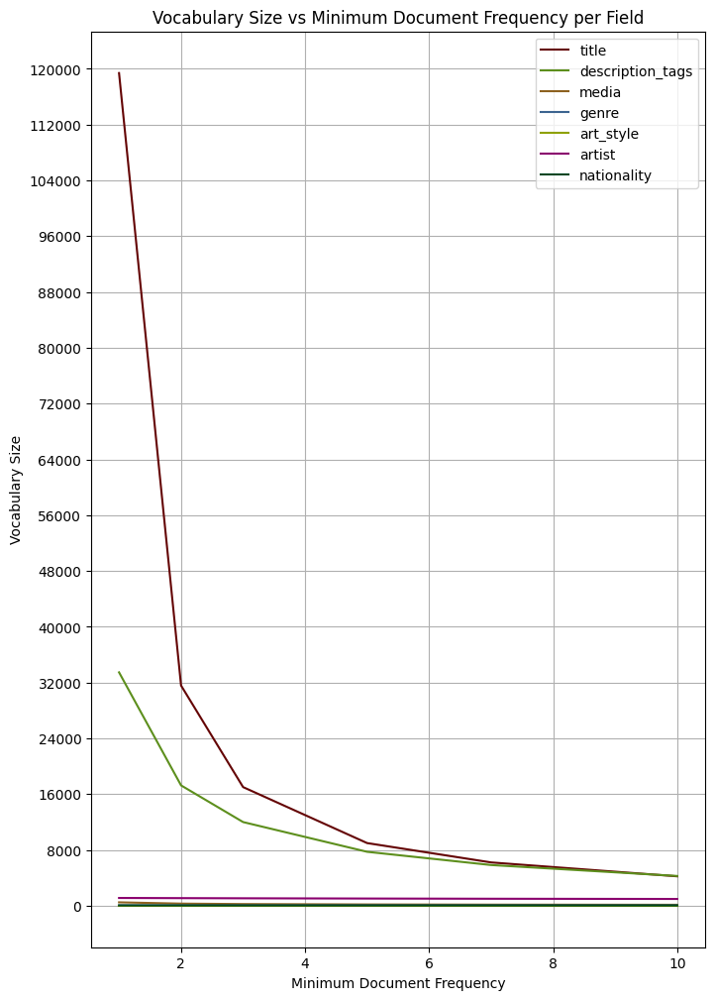

In [13]:
FIELDS = {
    "title": "title_clean",
    "description_tags": "description_tags_clean",
    "media": "media_clean",
    "genre": "genre_clean",
    "art_style": "art_style_clean",
    "artist": "artist_clean",
    "nationality": "nationality_clean"
}

colors = ["#640404", "#5D8F1D", "#8D611F", "#3C6490",
          "#8EA100", "#8A006E", "#004623"]

def fetch_normalised_fields():
    conn = get_db_connection()
    cur = conn.cursor(cursor_factory=psycopg2.extras.RealDictCursor)

    # Fetch all rows title, genre, art_style, media, description tags, artist, nationality
    cur.execute("""
        SELECT 
            painting_id,
            title_clean,
            genre_clean,
            art_style_clean,
            media_clean,
            description_tags_clean, 
            artist_clean,
            nationality_clean
        FROM paintings_and_artists_metadata_tf_idf
        ORDER BY painting_id ASC;
    """)

    rows = cur.fetchall()

    cur.close()
    conn.close()

    return rows

def build_corpora(rows):
    corpora = {field: [] for field in FIELDS}
    for row in rows:
        for field, col in FIELDS.items():
            value = row[col] or ""
            corpora[field].append(value)
    return corpora

# Plot Different min_df values to analyse vocab size per field
def plot_vocab_size_per_field(corpora, min_df_values=[1,2,3,5,7,10]):
    results = {field: [] for field in FIELDS}
    
    # Compute vocab sizes for each min_df
    for min_df in min_df_values:
        for field, texts in corpora.items():
            vectorizer = TfidfVectorizer(
                tokenizer=str.split, 
                lowercase=False, 
                preprocessor=None, 
                token_pattern=None, 
                min_df=min_df, 
                max_df=0.8, 
                ngram_range=(1, 2))
            
            X = vectorizer.fit_transform(texts)
            vocab_size = len(vectorizer.vocabulary_)
            
            results[field].append(vocab_size)
    
    # Plot
    plt.figure(figsize=(8, 12))
    
    for i, (field, vocab_sizes) in enumerate(results.items()):
        plt.plot(min_df_values, vocab_sizes, label=field, color=colors[i % len(colors)])
    
    plt.xlabel("Minimum Document Frequency")
    plt.ylabel("Vocabulary Size")
    plt.title("Vocabulary Size vs Minimum Document Frequency per Field")
    plt.legend()
    plt.grid(True)
    plt.gca().yaxis.set_major_locator(plt.MaxNLocator(nbins=20))
    plt.show()

rows = fetch_normalised_fields()
corpora = build_corpora(rows)
plot_vocab_size_per_field(corpora)

In [14]:
# Manually chosen but can be updated grid search future work
MIN_DF_CONFIG = {
    "title": 3,               
    "description_tags": 3,    
    "media": 2,             
    "genre": 1,               
    "art_style": 1,           
    "artist": 1,             
    "nationality": 1          
}

def build_tf_idf_per_field(corpora):
    vectorizers = {}
    matrices = {}

    for field, texts in corpora.items():
        print(f"Building TF-IDF for field: {field}")
    
        vectorizer = TfidfVectorizer(
            tokenizer=str.split,            
            lowercase=False,                
            preprocessor=None,              
            token_pattern=None,             
            min_df=MIN_DF_CONFIG[field],    
            max_df=0.8,                     
            ngram_range=(1, 2)              
        )

        X = vectorizer.fit_transform(texts)

        print(f"  Shape: {X.shape}")
        print(f"  Vocabulary size: {len(vectorizer.vocabulary_)}")

        non_empty = sum(1 for t in texts if t.strip())
        print(f"  Non-empty docs: {non_empty}/{len(texts)}")

        vectorizers[field] = vectorizer
        matrices[field] = X

    return vectorizers, matrices

# Build TF-IDF per field
vectorizers, matrices = build_tf_idf_per_field(corpora)

Building TF-IDF for field: title
  Shape: (81444, 17015)
  Vocabulary size: 17015
  Non-empty docs: 79967/81444
Building TF-IDF for field: description_tags
  Shape: (81444, 12002)
  Vocabulary size: 12002
  Non-empty docs: 47805/81444
Building TF-IDF for field: media
  Shape: (81444, 308)
  Vocabulary size: 308
  Non-empty docs: 26610/81444
Building TF-IDF for field: genre
  Shape: (81444, 52)
  Vocabulary size: 52
  Non-empty docs: 52056/81444
Building TF-IDF for field: art_style
  Shape: (81444, 27)
  Vocabulary size: 27
  Non-empty docs: 81444/81444
Building TF-IDF for field: artist
  Shape: (81444, 1118)
  Vocabulary size: 1118
  Non-empty docs: 81444/81444
Building TF-IDF for field: nationality
  Shape: (81444, 57)
  Vocabulary size: 57
  Non-empty docs: 74346/81444


#### Plot Field Distributions for top-K items

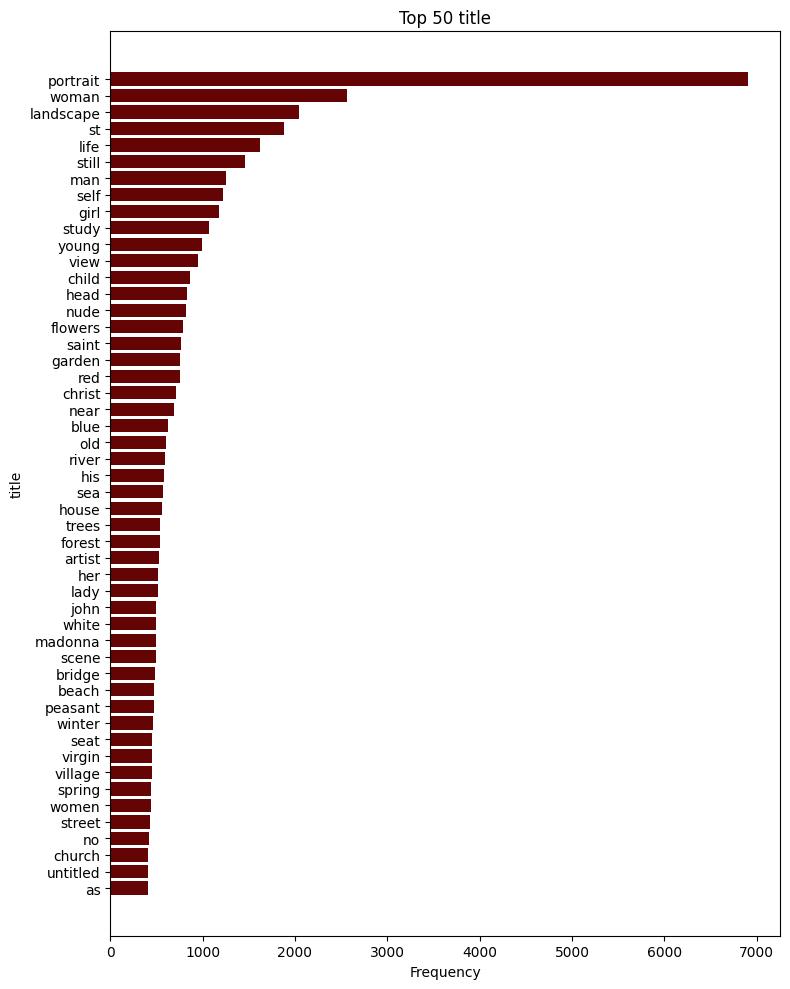

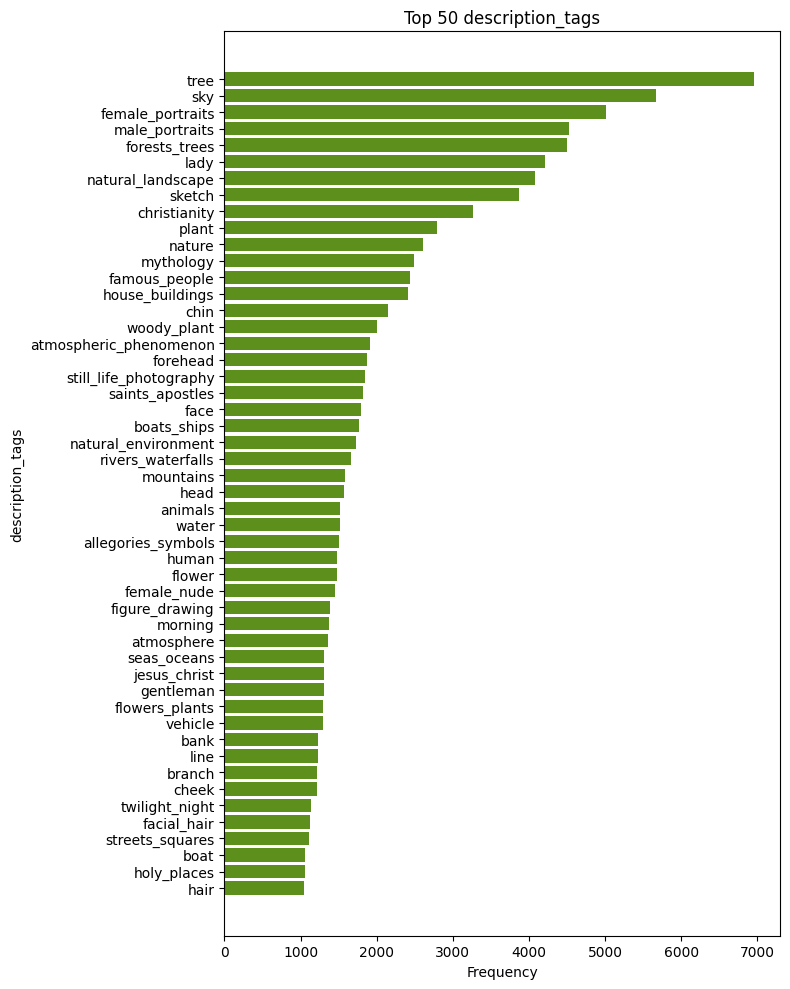

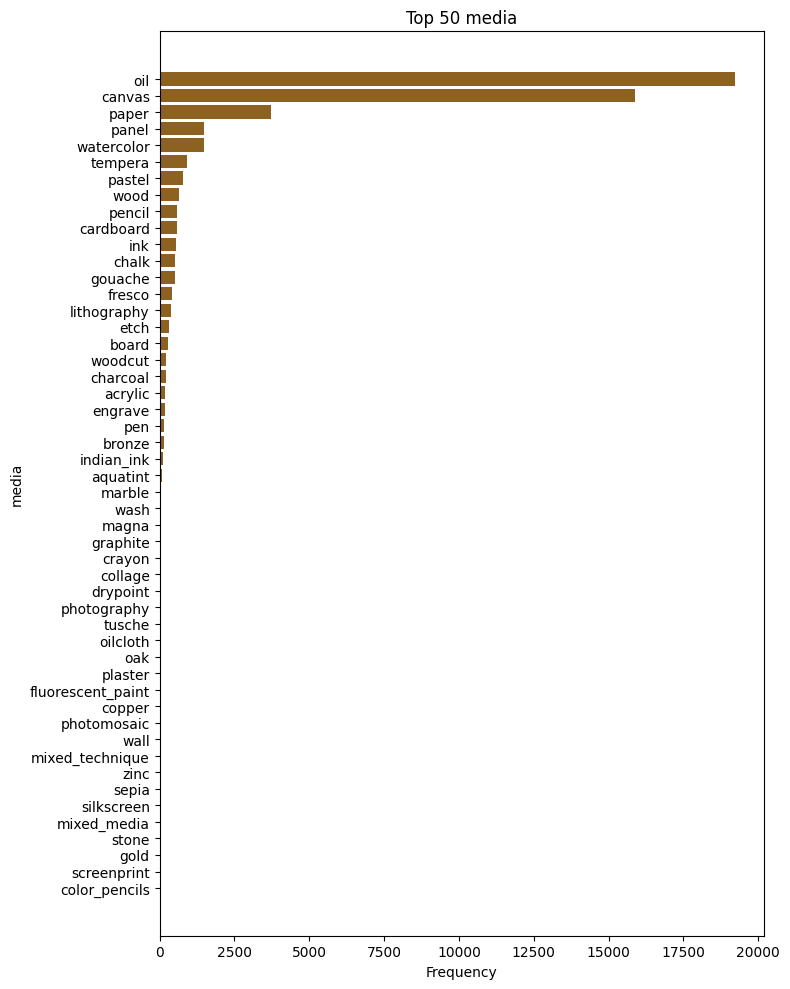

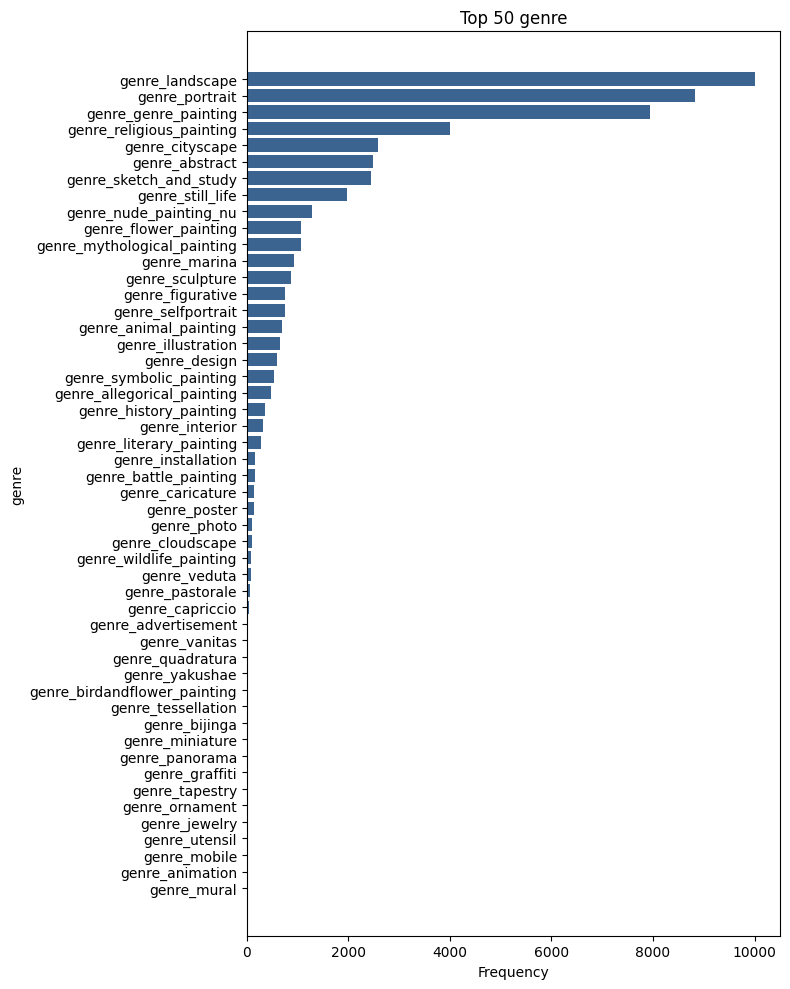

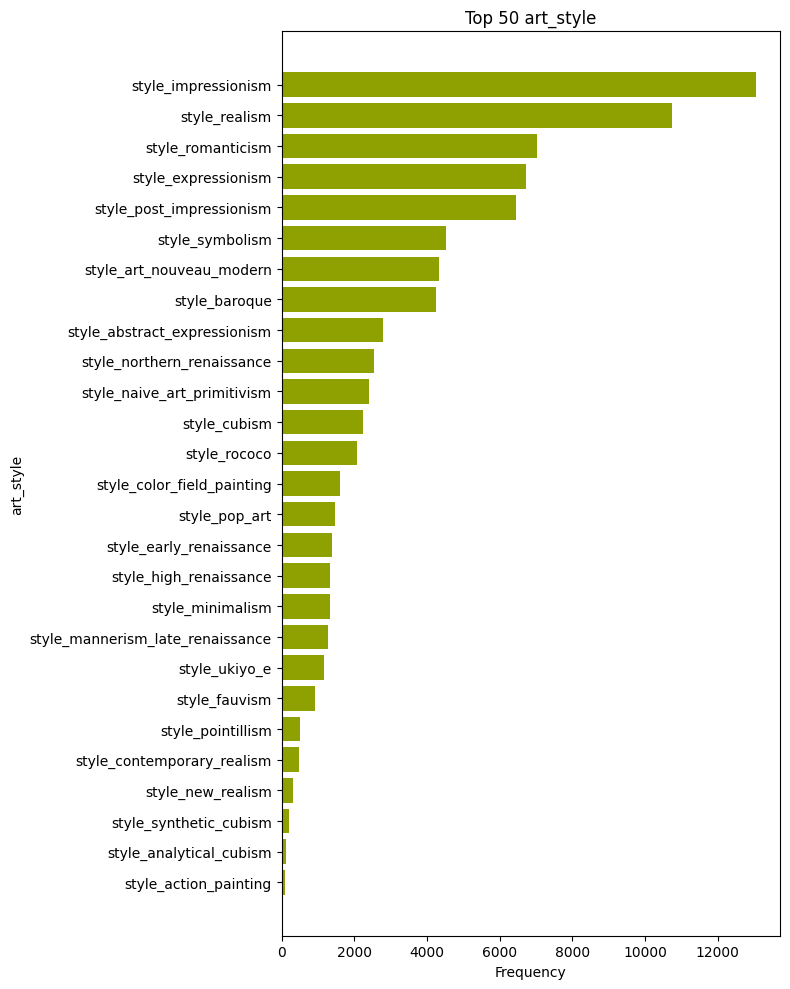

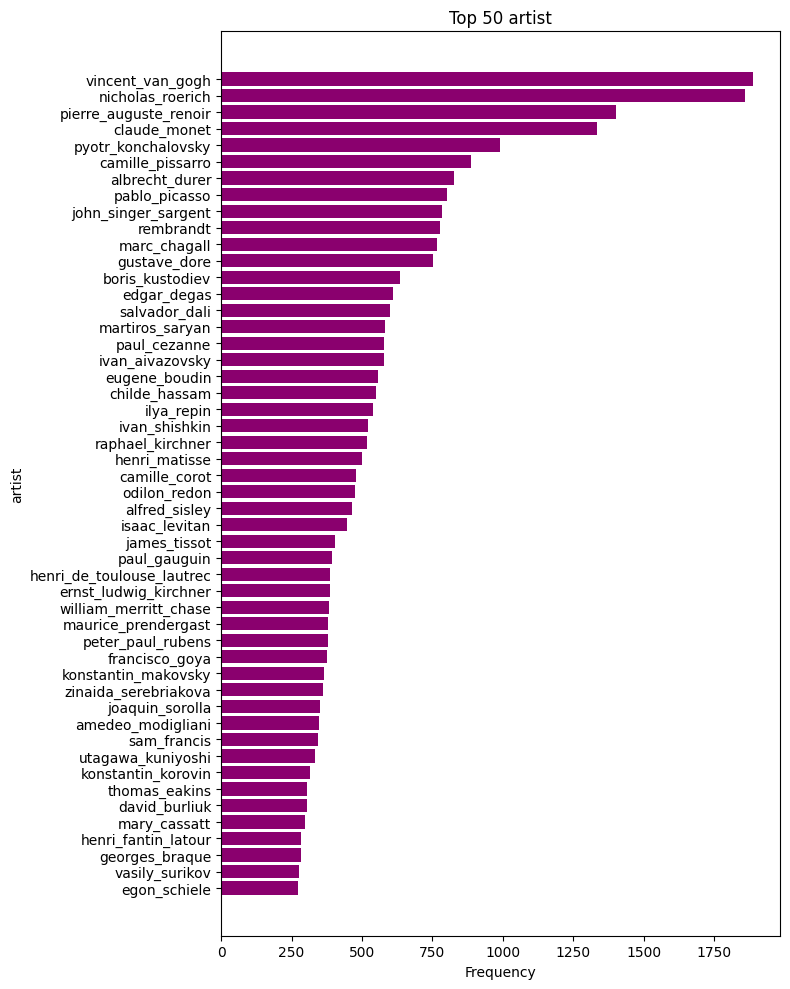

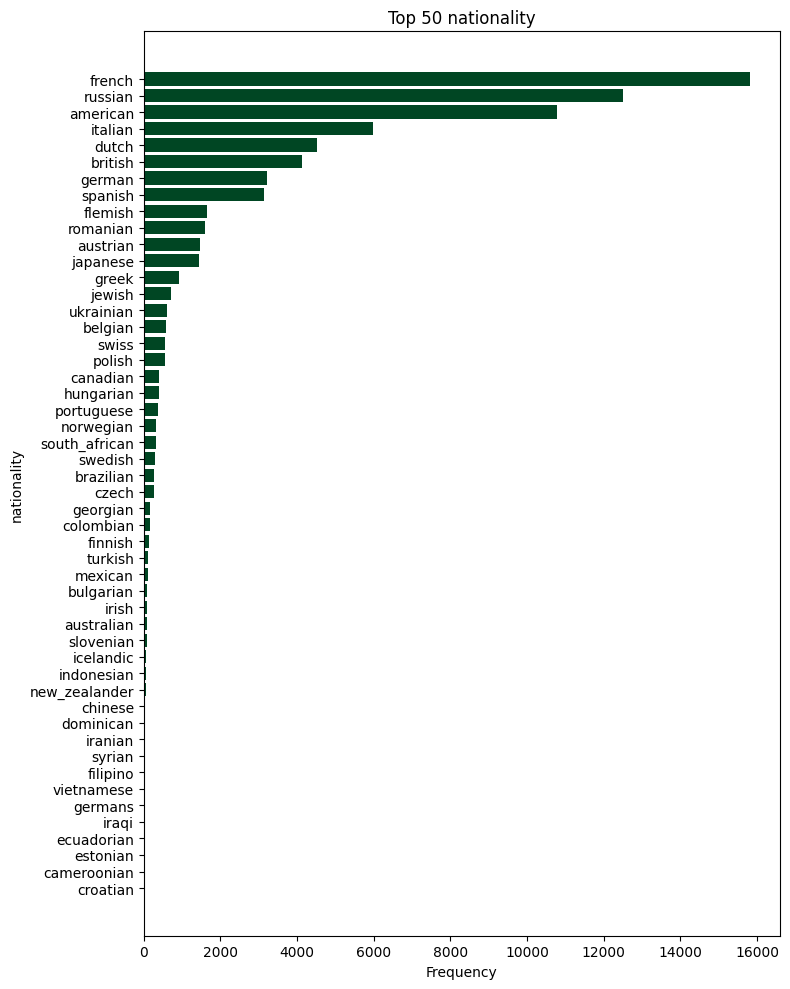

In [20]:
def compute_field_frequencies(corpora):
    field_freqs = {}

    for field, texts in corpora.items():
        counter = Counter()

        for text in texts:
            if text.strip():
                tokens = text.split()   
                counter.update(tokens)

        field_freqs[field] = counter

    return field_freqs

field_frequencies = compute_field_frequencies(corpora)
k=50

for i, (field, counter) in enumerate(field_frequencies.items()):
    most_common = counter.most_common(k)

    if not most_common:
        continue

    labels, values = zip(*most_common)

    plt.figure(figsize=(8,10))
    plt.barh(labels, values, color=colors[i % len(colors)])
    plt.gca().invert_yaxis()
    plt.title(f"Top {k} {field}")
    plt.xlabel("Frequency")
    plt.ylabel(field)

    plt.tight_layout()
    plt.show()

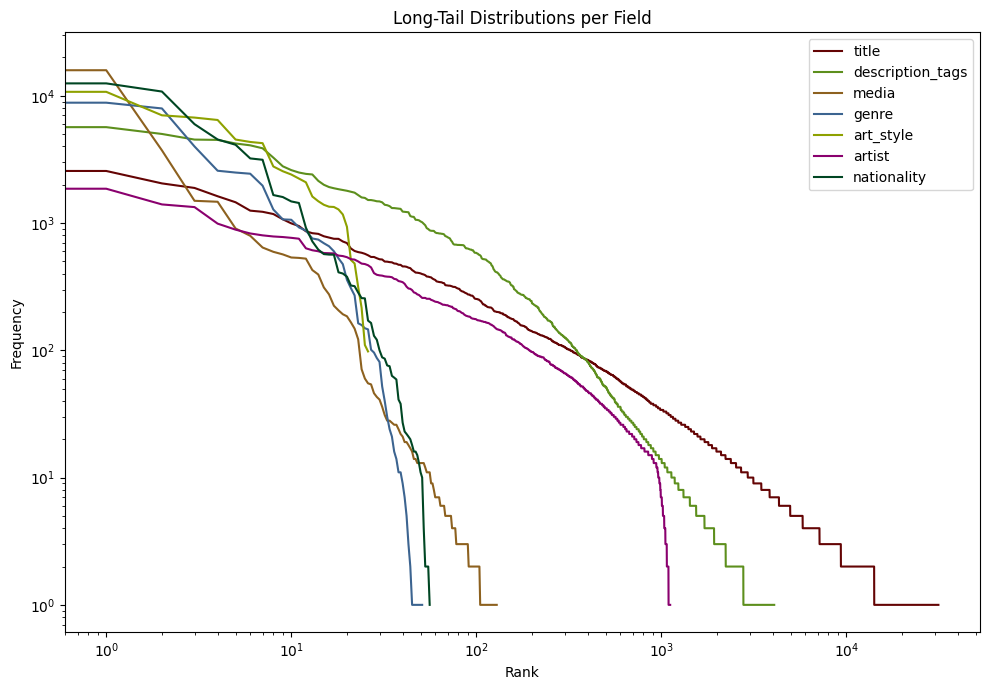

In [21]:
# Plot long-tail distribution per field
plt.figure(figsize=(10, 7))
for idx, (field, counter) in enumerate(field_frequencies.items()):
    freqs = sorted(counter.values(), reverse=True)

    if not freqs:
        continue

    plt.plot(
        freqs,
        label=field,
        color=colors[idx % len(colors)]
    )

plt.yscale("log")
plt.xscale("log")

plt.title("Long-Tail Distributions per Field")
plt.xlabel("Rank")
plt.ylabel("Frequency")

plt.legend()
plt.tight_layout()
plt.show()

#### Test Query Vector of Painting User Interacted with

In [15]:
# Raw Test Query 
query = {
    "painting_id" : "30081",
    "title": "The Seine At Bougival In The Evening",
    "description_tags": "Sky,Tree,Bank",
    "media": "",
    "artist": "Claude Monet",
    "genre": "landscape",
    "art_style": "Impressionism",
    "nationality": "French"
}
    
# Handle NULLs/Missing Values 
query["title"] = replace_null(query["title"])
query["description_tags"] = replace_null(query["description_tags"])
query["media"] = replace_null(query["media"])
query["artist"] = replace_missing_categorical(query["artist"])
query["genre"] = replace_missing_categorical(query["genre"])
query["art_style"] = replace_missing_categorical(query["art_style"])
query["nationality"] = replace_missing_categorical(query["nationality"])

# Normalise and Clean
clean_title = normalise_text(query["title"])
clean_desc_tags = normalise_multi_value(query["description_tags"], apply_segmentation=True)
clean_media = normalise_multi_value(query["media"])
clean_artist = normalise_categorical(query["artist"])
clean_genre = normalise_categorical(query["genre"], field_name="genre", prefix=True)
clean_style = normalise_categorical(query["art_style"], field_name="style", prefix=True)
clean_nationality = normalise_categorical(query["nationality"])

query_clean = {
    "painting_id" : "55055",
    "title": clean_title,
    "description_tags": clean_desc_tags,
    "media": clean_media,
    "artist": clean_artist,
    "genre": clean_genre,
    "art_style": clean_style,
    "nationality": clean_nationality
}
print(query_clean)

def vectorise_query_per_field(query_dict, vectorisers):
    query_vectors = {}

    for field, vectorizer in vectorisers.items():
        text = query_dict.get(field, "")
        query_vectors[field] = vectorizer.transform([text])

    return query_vectors

{'painting_id': '55055', 'title': 'seine bougival evening', 'description_tags': 'sky tree bank', 'media': '', 'artist': 'claude_monet', 'genre': 'genre_landscape', 'art_style': 'style_impressionism', 'nationality': 'french'}


#### Cosine-Similarity and Late Feature Fusion

In [16]:
# Weights per Feild according to importance - change using grid search
WEIGHTS = {
    "title": 0.1,
    "description_tags": 0.15,
    "media": 0.15,
    "genre": 0.2,
    "art_style": 0.2,
    "artist": 0.1,
    "nationality": 0.1
}

def normalise_weights(weights):
    total = sum(weights.values())
    return {k: v / total for k, v in weights.items()}

WEIGHTS = normalise_weights(WEIGHTS)

# Since the fields are L2-normalised by default when using tfidfVectorizer, 
# the following dot product is equivalent to cosine-similarity 
def compute_similarity_per_field(query_vectors, matrices):
    similarities = {}

    for field in matrices:
        sim = query_vectors[field] @ matrices[field].T

        if hasattr(sim, "toarray"):   # sparse matrix
            sim = sim.toarray().ravel()
        else:                         # numpy array
            sim = sim.ravel()
        similarities[field] = sim.flatten()  
    return similarities

def weighted_late_fusion(similarities, weights):
    final_scores = np.zeros(len(next(iter(similarities.values()))))

    for field, sim in similarities.items():
        final_scores += weights.get(field, 0) * sim

    return final_scores

Note that cosine similarity is NOT in the range;

$$
−1≤cos_f​(i)≤1
$$
 
Since the composite similarity score is computed during weighted late fusion, hence cosine similarity is in the range;

$$
S_i​∈[−∑_f​w_f​, ∑_f​w_f​]
$$

where $S_i$ is defined as:

$$
S_i​=∑_f​w_f​⋅cos_f​(i)
$$


#### Retreival and Ranking 

In [17]:
def get_top_k(final_scores, query_index, k=30):
    final_scores = final_scores.copy()
    final_scores[query_index] = -np.inf
    top_indices = np.argpartition(final_scores, -k)[-k:]
    top_indices = top_indices[np.argsort(final_scores[top_indices])[::-1]]
    return top_indices, final_scores[top_indices]

In [27]:
painting_id_to_index = {
    row["painting_id"]: idx
    for idx, row in enumerate(rows)
}

query_index = painting_id_to_index[int(query_clean["painting_id"])]
def recommend(query_dict, vectorisers, matrices, weights, query_index, k=10):
    query_vectors = vectorise_query_per_field(query_dict, vectorisers)
    similarities = compute_similarity_per_field(query_vectors, matrices)
    final_scores = weighted_late_fusion(similarities, weights)
    top_indices, scores = get_top_k(final_scores, query_index, k)
    return top_indices, scores, similarities

# Take Cleaned Query
top_indices, scores, similarities = recommend(query_clean, vectorizers, matrices, WEIGHTS, query_index, k=10)

def fetch_paintings(painting_ids):
    conn = get_db_connection()
    cur = conn.cursor(cursor_factory=psycopg2.extras.RealDictCursor)

    # Preserve order 
    cur.execute("""
        SELECT 
            painting_id,
            title,
            artist,
            genre, 
            art_style,
            media,
            description_tags,
            nationality,
            image_path
        FROM paintings_and_artists_metadata_tf_idf
        WHERE painting_id = ANY(%s)
        ORDER BY array_position(%s, painting_id);
    """, (painting_ids, painting_ids))

    rows = cur.fetchall()

    cur.close()
    conn.close()

    return rows

1. Painting ID: 30080, Score: 0.8500
   Title: The Seine At Bennecourt Winter
   Artist: Claude Monet
   Genre: unknown
   Art Style: Impressionism
   Media: 
   Description Tags: 
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_the-seine-at-bennecourt-winter.jpg


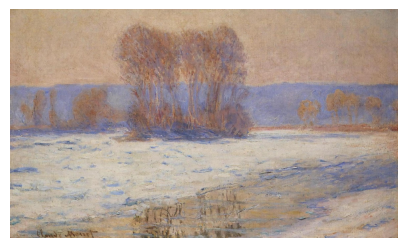

2. Painting ID: 29707, Score: 0.7444
   Title: Rough Sea
   Artist: Claude Monet
   Genre: marina
   Art Style: Impressionism
   Media: 
   Description Tags: Boats-And-Ships,Seas-And-Oceans,Vehicle,Ship,Watercraft,Frigate,Boat
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_rough-sea.jpg


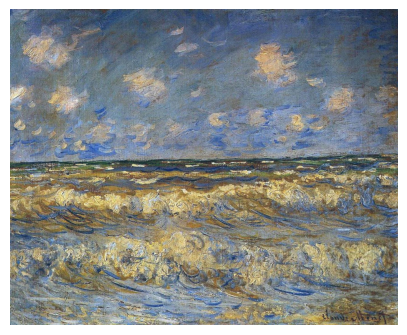

3. Painting ID: 29229, Score: 0.7021
   Title: Cap Martin 3
   Artist: Claude Monet
   Genre: landscape
   Art Style: Impressionism
   Media: 
   Description Tags: Water,Tree,Leaf,Shore
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_cap-martin-3.jpg


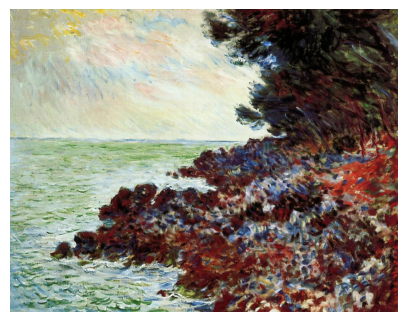

4. Painting ID: 29434, Score: 0.6888
   Title: Ice Floes On Siene
   Artist: Claude Monet
   Genre: landscape
   Art Style: Impressionism
   Media: 
   Description Tags: 
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_ice-floes-on-siene.jpg


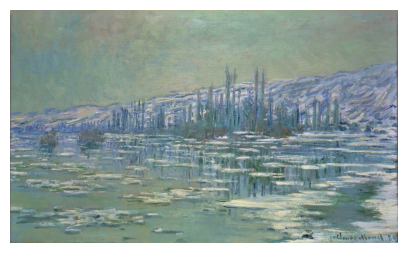

5. Painting ID: 29733, Score: 0.6801
   Title: Sandviken Norway
   Artist: Claude Monet
   Genre: unknown
   Art Style: Impressionism
   Media: 
   Description Tags: 
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_sandviken-norway.jpg


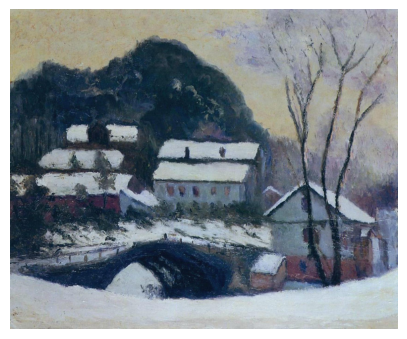

6. Painting ID: 29750, Score: 0.6799
   Title: Small Boat On The Small Branch Of The Seine At Argenteuil
   Artist: Claude Monet
   Genre: landscape
   Art Style: Impressionism
   Media: 
   Description Tags: Boat,Sailboat,Sail,Vehicle,Tree,Bank,Bayou,Watercraft
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_small-boat-on-the-small-branch-of-the-seine-at-argenteuil.jpg


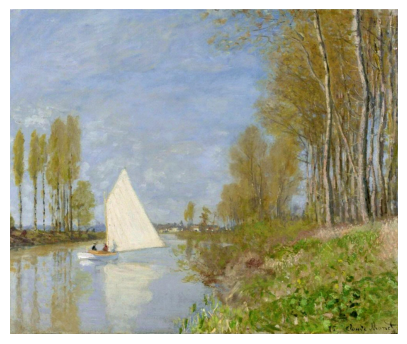

7. Painting ID: 30044, Score: 0.6721
   Title: The Road To Giverny
   Artist: Claude Monet
   Genre: landscape
   Art Style: Impressionism
   Media: 
   Description Tags: 
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_the-road-to-giverny.jpg


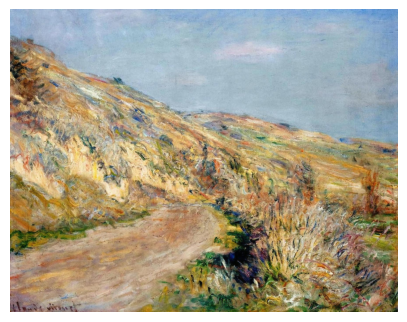

8. Painting ID: 29315, Score: 0.6715
   Title: Evening At Argenteuil
   Artist: Claude Monet
   Genre: landscape
   Art Style: Impressionism
   Media: 
   Description Tags: Atmosphericphenomenon,Tree,Sky
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_evening-at-argenteuil.jpg


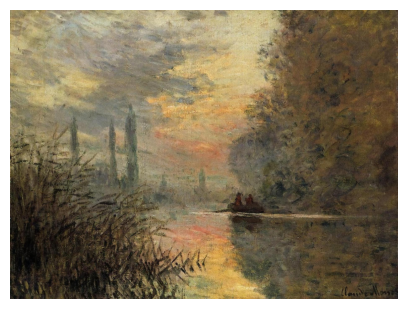

9. Painting ID: 29822, Score: 0.6651
   Title: The Banks Of The Seine Ile De La Grande Jatte
   Artist: Claude Monet
   Genre: unknown
   Art Style: Impressionism
   Media: 
   Description Tags: 
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_the-banks-of-the-seine-ile-de-la-grande-jatte.jpg


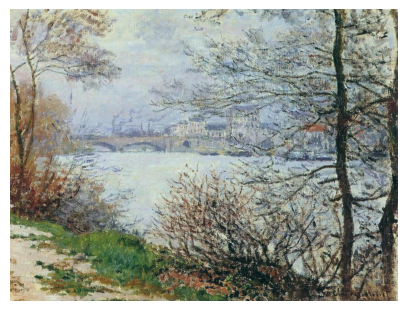

10. Painting ID: 30102, Score: 0.6637
   Title: The Seine Near Argenteuil
   Artist: Claude Monet
   Genre: landscape
   Art Style: Impressionism
   Media: 
   Description Tags: Sky,Grassfamily
   Nationality: French
   Image Path: paintings/Impressionism/claude-monet_the-seine-near-argenteuil.jpg


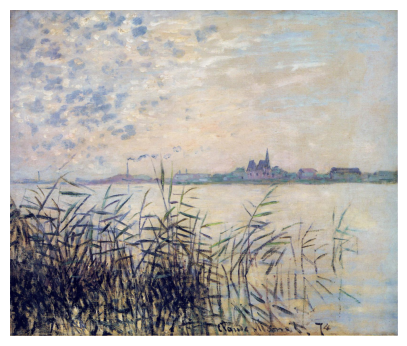

In [ ]:
# Fetch the top painting metadata and image paths from the database
painting_ids = top_indices.tolist()
painting_ids.append('')
paintings = fetch_paintings(painting_ids)

for rank, painting in enumerate(paintings, start=1):
    print(f"{rank}. Painting ID: {painting['painting_id']}, Score: {scores[rank-1]:.4f}")
    print(f"   Title: {painting['title']}")
    print(f"   Artist: {painting['artist']}")
    print(f"   Genre: {painting['genre']}")
    print(f"   Art Style: {painting['art_style']}")
    print(f"   Media: {painting['media']}")
    print(f"   Description Tags: {painting['description_tags']}")
    print(f"   Nationality: {painting['nationality']}")
    print(f"   Image Path: {painting['image_path']}")

    image_path = painting.get('image_path')
    if image_path:
        image_path = (dataset_path / image_path).resolve()
        image = cv2.imread(str(image_path))
        if image is not None:
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(5, 5))
            plt.imshow(image_rgb)
            plt.axis('off')
            plt.show()
        else:
            print(f"Unable to load image from path: {image_path}")
    else:
        print("No image_path available for this painting.")

#### Per-Field Contribution Analysis

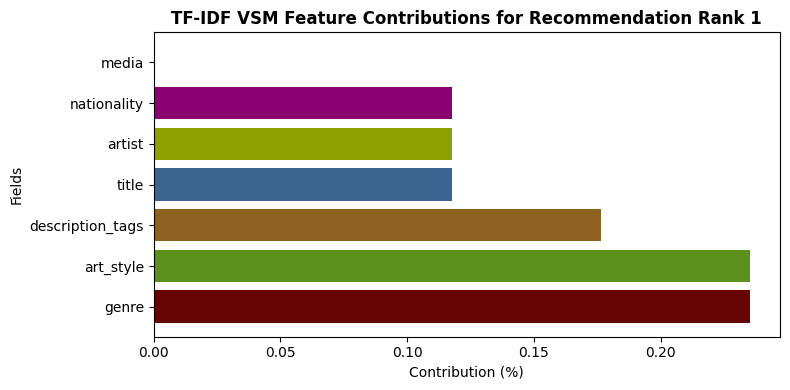

In [21]:
def compute_feature_contributions(similarities, weights, retrieved_doc_idx):
    contributions = {}
    total = 0

    for field in similarities:
        value = weights[field] * similarities[field][retrieved_doc_idx]
        contributions[field] = value
        total += value

    # Normalise to percentages
    normalised = {
        field: (value / total if total != 0 else 0)
        for field, value in contributions.items()
    }

    return contributions, normalised, total

colors = ["#640404", "#5D8F1D", "#8D611F", "#3C6490",
          "#8EA100", "#8A006E", "#004623"]

# Compute contributions
retrieved_doc_index = top_indices[0]
contribs, norm_contribs, total = compute_feature_contributions(similarities, WEIGHTS, retrieved_doc_index)
sorted_items = sorted(norm_contribs.items(), key=lambda x: x[1], reverse=True)

labels = [k.replace('_missing', '') for k, _ in sorted_items]
values = [v for _, v in sorted_items]

# Plot bar chart
plt.figure(figsize=(8, 4))
plt.barh(labels, values, color=colors)

plt.title("TF-IDF VSM Feature Contributions for Recommendation Rank 1", fontweight='bold')
plt.xlabel("Contribution (%)")
plt.ylabel("Fields")

plt.tight_layout()
plt.show()

# Evaluation 

**Predictive Quality Metrics**; Precision@k, Recall@k, F1-score@k

**Ranking Quality Metrics**; MRR, MAP, NDCG, Hit Rate

**Behavioural Metrics**; Diversity, Novelty, Serendipity, Popularity bias 

*NB: Metrics to be displayed on a live monitoring dashboard, on the website*

https://www.evidentlyai.com/ranking-metrics/evaluating-recommender-systems#map

## Behavioural Metrics

In [18]:
# Build a query using all rows of the database to perform a dataset-level estimate of diversity
def build_query(row):
    query = {
        "painting_id": row["painting_id"],
        "title": replace_null(row["title_clean"]),
        "description_tags": replace_null(row["description_tags_clean"]),
        "media": replace_null(row["media_clean"]),
        "artist": replace_missing_categorical(row["artist_clean"]),
        "genre": replace_missing_categorical(row["genre_clean"]),
        "art_style": replace_missing_categorical(row["art_style_clean"]),
        "nationality": replace_missing_categorical(row["nationality_clean"])
    }

    query_clean = {
        "painting_id": int(query["painting_id"]),
        "title": normalise_text(query["title"]),
        "description_tags": normalise_multi_value(query["description_tags"], apply_segmentation=True),
        "media": normalise_multi_value(query["media"]),
        "artist": normalise_categorical(query["artist"]),
        "genre": normalise_categorical(query["genre"], field_name="genre", prefix=True),
        "art_style": normalise_categorical(query["art_style"], field_name="style", prefix=True),
        "nationality": normalise_categorical(query["nationality"])
    }

    return query_clean

#### Diversity 

Measures how similar the recommended items are to each other, thus Intra List Similarity (ILS), where low similarity indicates high diversity and high similarity indicates redundant recommendations due to high similarity.

For a recommendation list:

$$
R = \{ i_1, \dots, i_K \}
$$

the Intra-List Similarity (ILS) is defined as:

$$
ILS = \frac{2}{K(K - 1)} \sum_{a < b} \mathrm{sim}(i_a, i_b)
$$

where $\mathrm{sim}(i_a, i_b)$ is a similarity function between items $i_a$ and $i_b$.

Diversity is then defined as:

$$
Diversity = 1 - ILS
$$

In [19]:
# Since diversity can only be computed using a single vector per item (painting), perform 
# weighted fusion 
def build_weighted_item_vectors(matrices, weights):
    # matrices[field] = (num_items, num_features_field)
    weighted_matrices = []
    
    for field, matrix in matrices.items():
        weight = weights.get(field, 0)
        weighted_matrices.append(matrix * weight)
    
    # Concatenate all fields into one vector
    return hstack(weighted_matrices)

# Compute intra-list similarity i.e. diversity
def compute_diversity(top_indices, item_vectors):
    vectors = item_vectors[top_indices]  # shape (K, D)
    sim_matrix = cosine_similarity(vectors)
    K = len(top_indices)
    
    # Take upper triangle, hence excluding the diagonal
    pairwise_sims = sim_matrix[np.triu_indices(K, k=1)]
    ils = np.mean(pairwise_sims) if len(pairwise_sims) > 0 else 0
    diversity = 1 - ils
    
    return diversity

#### Novelty 
Novelty is inverse popularity, meaning it measures how uncommon/long-tail the recommendations are, where high novelty indicates rare items and low novely indicates popular items (also referred to as popularity bias). More on popularity bias will be discussed in further detail below. 

A typical formulation of item novelty is defined as:

$$
Novelty(i) = -\log_2 \left( \frac{popularity(i)}{N} \right)
$$

where $popularity(i)$ is the number of interactions (or popularity count) of item $i$, and $N$ is the total number of interactions in the dataset.

The overall novelty of a recommendation list $R$ is then computed by averaging over the top-$K$ recommended items:

For a recommendation list;

$$
R = \{ i_1, \dots, i_K \}
$$

$$
Novelty(R) = \frac{1}{K} \sum_{i \in R} Novelty(i)
$$


In [35]:
# Use different fields like genre, art_style, description_tags, etc.. 
def build_field_popularity(rows):
    genre = Counter()
    art_style = Counter()
    description_tags = Counter()
    media = Counter()
    nationality = Counter()
    artist = Counter()

    for row in rows:
        genre[row["genre_clean"]] += 1
        art_style[row["art_style_clean"]] += 1
        nationality[row["nationality_clean"]] += 1
        artist[row["artist_clean"]] += 1

        for tag in row["description_tags_clean"].split():
            description_tags[tag] += 1

        for m in row["media_clean"].split():
            media[m] += 1

    return {
        "genre": genre,
        "art_style": art_style,
        "description_tags": description_tags,
        "media": media,
        "nationality": nationality,
        "artist": artist,
    }

POPULARITY_WEIGHTS = {
    "genre": 0.2,
    "art_style": 0.2,
    "description_tags": 0.15,
    "media": 0.15,
    "nationality": 0.1,
    "artist": 0.1
}

def field_probability(field_pop, value, total_items):
    if isinstance(value, list):
        values = [v for v in value if v]

        if len(values) == 0:
            return 1 / total_items  # neutral probability if empty field

        return np.mean([
            field_pop.get(v, 1) / total_items for v in values
        ])

    if value == "":
        return 1 / total_items

    return field_pop.get(value, 1) / total_items

def compute_novelty(top_indices, rows, field_popularity, total_items, weights):
    scores = []

    for idx in top_indices:
        row = rows[idx]

        item_score = 0
        
        # popularity based novelty computations 
        genre = row["genre_clean"]
        p = field_probability(field_popularity["genre"], genre, total_items) 
        item_score += weights["genre"] * (-np.log2(p))

        style = row["art_style_clean"]
        p = field_probability(field_popularity["art_style"], style, total_items) 
        item_score += weights["art_style"] * (-np.log2(p))

        tags = row["description_tags_clean"].split()
        p = field_probability(field_popularity["description_tags"], tags, total_items) 
        item_score += weights["description_tags"] * (-np.log2(p))

        media = row["media_clean"].split()
        p = field_probability(field_popularity["media"], media, total_items) 
        item_score += weights["media"] * (-np.log2(p))

        nat = row["nationality_clean"]
        p = field_probability(field_popularity["nationality"], nat, total_items) 
        item_score += weights["nationality"] * (-np.log2(p))

        artist = row["artist_clean"]
        p = field_probability(field_popularity["artist"], artist, total_items)
        item_score += weights["artist"] * (-np.log2(p))

        scores.append(item_score)

    return np.mean(scores)

#### Serendipity 

Unexpectedness in contrast to ground truths (user interaction history)


#### Popularity bias 

In the context of content-based recommendation systems, popularity bias emerges from frequent artsits, genres, etc... that dominate similarity resulting in a distribution skew, as seen in earlier plots for top k most frequent items per field. Unlike collaborative filtering, this system does not explicitly learn popularity, therefore frequency in the metadata space is what "popularity" is defined as in this system. The following metrics will be used to analyse popularity bias in the top-k recommendations per query.

**Average Recommendation Popularity (ARP)** is defined as follows;

$$
ARP= \frac{1}{∣R∣} ∑_{​i∈R} ​popularity(i)
$$

Where;

$R$ = recommended items, and

$popularity(i)$ = frequency or probability


In [41]:
def compute_item_popularity(idx, rows, field_popularity, total_items, weights):
    row = rows[idx]
    score = 0

    genre = row["genre_clean"]
    p = field_popularity["genre"].get(genre, 1) / total_items
    score += weights["genre"] * p

    style = row["art_style_clean"]
    p = field_popularity["art_style"].get(style, 1) / total_items
    score += weights["art_style"] * p

    tags = row["description_tags_clean"].split()
    if tags:
        p = np.mean([field_popularity["description_tags"].get(t, 1) / total_items for t in tags])
    else:
        p = 1 / total_items
    score += weights["description_tags"] * p

    media = row["media_clean"].split()
    if media:
        p = np.mean([field_popularity["media"].get(m, 1) / total_items for m in media])
    else:
        p = 1 / total_items
    score += weights["media"] * p

    nat = row["nationality_clean"]
    p = field_popularity["nationality"].get(nat, 1) / total_items
    score += weights["nationality"] * p

    artist = row["artist_clean"]
    p = field_popularity["artist"].get(artist, 1) / total_items
    score += weights["artist"] * p

    return score

def compute_arp(top_indices, rows, field_popularity, total_items, weights):
    scores = [
        compute_item_popularity(idx, rows, field_popularity, total_items, weights)
        for idx in top_indices
    ]
    return np.mean(scores)

**Coverage** is defined as follows;

$$
Coverage = \frac{\text{unique recommended items}}{\text{total dataset size}}
​$$

Low coverage indicates the same items are repeated, meaning the recommendations are highly biased, whereas high coverage indicates exploration and low bias.


In [42]:
def compute_coverage(all_top_k_lists, total_items):
    recommended_items = set()

    for top_indices in all_top_k_lists:
        recommended_items.update(top_indices)

    return len(recommended_items) / total_items

**Gini Index** measures the inequality of recommendation distribution, where ≈0 indicates a fair distribution and ≈1 indicates only a few items dominate.

The Gini Coefficient formula is defined as follows;

$$
G = \frac{n + 1 - 2 \cdot \frac{\sum_{i=1}^{n} C_i}{C_n}}{n}
$$

Where;

$n$ = total number of items,

$f_i$ = frequency of item $i$ (after sorting in ascending order)

$C_i=∑_{j=1}^{i} f_j$ = cumulative frequency up to index $i$

$C_n=∑_{i=1}^{n} f_i$ = total frequency (normalization term)

In [43]:
def compute_gini(all_top_k_lists, total_items):
    freq = np.zeros(total_items)

    for top_indices in all_top_k_lists:
        for idx in top_indices:
            freq[idx] += 1

    freq = np.sort(freq)

    n = len(freq)
    cumulative = np.cumsum(freq)

    if cumulative[-1] == 0:
        return 0

    gini = (n + 1 - 2 * np.sum(cumulative) / cumulative[-1]) / n
    return gini

### Behavioural Metric Results

In [44]:
def evaluation(rows, vectorisers, matrices, weights, item_vectors, painting_id_to_index, k):
    conn = get_db_connection()
    cur = conn.cursor()

    diversity_scores = []
    novelty_scores = []
    arp_scores = []
    all_top_k_lists = []

    field_popularity_dict = build_field_popularity(rows)
    total_items = len(rows)
    novelty_field_weights = normalise_weights(POPULARITY_WEIGHTS)
    assert abs(sum(novelty_field_weights.values()) - 1) < 1e-6

    # Build query for each painting, get recommendations, and compute metrics per recommendation list, then add to DB
    for row in rows:
        query_clean = build_query(row)
        painting_id = query_clean["painting_id"]
        query_index = painting_id_to_index[painting_id]
        top_indices, _, _ = recommend(query_clean, vectorisers, matrices, weights, query_index, k)
        all_top_k_lists.append(top_indices)

        # Diversity computation uses item similarity i.e. TF-IDF vectors 
        diversity = compute_diversity(top_indices, item_vectors)
        diversity_scores.append(diversity)

        # Since novelty is a global dataset property, global frequency statistics are used
        novelty = compute_novelty(top_indices, rows, field_popularity_dict, total_items, novelty_field_weights)
        novelty_scores.append(novelty)

        # Compute average recomendation popularity
        arp = compute_arp(top_indices, rows, field_popularity_dict, total_items, novelty_field_weights)
        arp_scores.append(arp)

        print(f"Painting ID: {painting_id}, Diversity: {diversity}, Novelty: {novelty}, ARP: {arp}")

        # cur.execute("""
        #     UPDATE paintings_and_artists_metadata_tf_idf
        #     SET diversity = %s,
        #         novelty = %s,
        #         arp = %s
        #     WHERE painting_id = %s;
        # """, (float(diversity), float(novelty), float(arp), painting_id))

    conn.commit()
    cur.close()
    conn.close()

    coverage = compute_coverage(all_top_k_lists, total_items)
    gini = compute_gini(all_top_k_lists, total_items)

    return {
        "diversity": np.mean(diversity_scores),
        "diversity_scores": diversity_scores,
        "novelty": np.mean(novelty_scores),
        "novelty_scores": novelty_scores,
        "arp": np.mean(arp_scores),
        "arp_scores": arp_scores,
        "coverage": coverage,
        "gini": gini
    }

In [45]:
painting_id_to_index = {
    row["painting_id"]: idx
    for idx, row in enumerate(rows)
}

item_vectors = build_weighted_item_vectors(matrices, WEIGHTS)
item_vectors = normalize(item_vectors, norm='l2')

results = evaluation(rows, vectorizers, matrices, WEIGHTS, item_vectors, painting_id_to_index, k=20)

Painting ID: 1, Diversity: 0.26850459914576874, Novelty: 9.591311255004687, ARP: 0.04418361679327036
Painting ID: 2, Diversity: 0.2309482904122503, Novelty: 9.464911256203123, ARP: 0.040050152899879406
Painting ID: 3, Diversity: 0.2646310279351416, Novelty: 9.591380565786228, ARP: 0.044182708705095254
Painting ID: 4, Diversity: 0.27005296420469027, Novelty: 9.503111063835874, ARP: 0.044340575357846426
Painting ID: 5, Diversity: 0.5144030145531993, Novelty: 8.091525857793975, ARP: 0.029522004553912982
Painting ID: 6, Diversity: 0.25855297115657694, Novelty: 9.449483192532407, ARP: 0.04018282756658973
Painting ID: 7, Diversity: 0.26866070917331286, Novelty: 9.576833930696248, ARP: 0.04429356964430912
Painting ID: 8, Diversity: 0.46080203228545513, Novelty: 9.037091309082607, ARP: 0.034404152614748246
Painting ID: 9, Diversity: 0.482483723965327, Novelty: 8.998054930030287, ARP: 0.03471762635812474
Painting ID: 10, Diversity: 0.6501018894962876, Novelty: 7.6577983541547265, ARP: 0.0340653

In [48]:
# Average diversity, novelty, and arp over all top-k recommended items per query 
# as well as coverage and gini index
diversity_score = results["diversity"]
novelty_score = results["novelty"]
arp_score = results["arp"]
diversity_scores = results["diversity_scores"]
novelty_scores = results["novelty_scores"]
arp_scorse = results["arp_scores"]
coverage = results["coverage"]
gini = results["gini"] 

print(f"Diversity: {diversity_score:.4f}")
print(f"Novelty: {novelty_score:.4f}")
print(f"ARP: {arp_score:.4f}")
print(f"Coverage: {coverage:.4f}")
print(f"Gini Index: {gini:.4f}")

Diversity: 0.4109
Novelty: 8.1120
ARP: 0.0792
Coverage: 0.9877
Gini Index: 0.4033


In [49]:
joblib.dump(diversity_scores, "tfidf_diversity.pkl")
joblib.dump(novelty_scores, "tfidf_novelty.pkl")

['tfidf_novelty.pkl']